# Hierarchical Exponential Smoothing Model

In this blog post, we experiment with a hierarchical exponential smoothing forecasting model, extending the ideas from the univariate case presented in the blog post ["Notes on Exponential Smoothing with NumPyro"](https://juanitorduz.github.io/exponential_smoothing_numpyro/). We use [NumPyro](https://github.com/pyro-ppl/numpyro) and compare the NUTS and SVI results. For such a purpose, we use **Continuous Ranked Probability Score** ([CRPS](https://towardsdatascience.com/crps-a-scoring-function-for-bayesian-machine-learning-models-dd55a7a337a8)). We also compare these forecasts with univariate statistical models like Holt-Winters, AutoETS and Seasonal Naive from the great [Statsforecast](https://nixtlaverse.nixtla.io/statsforecast/index.html) package. These baseline models are, in general, hard to beat!

A (partial) motivation for this experiment is the recently released package  [Prophetverse](https://github.com/felipeangelimvieira/prophetverse), which extends the model ideas from [Prophet](https://facebook.github.io/prophet/) to hierarchical models (also in NumPyro) and with custom likelihoods. Even though Prophet does not perform as expected in many real applications (see, for example [here](https://sarem-seitz.com/posts/facebook-prophet-covid-and-why-i-dont-trust-the-prophet/) among others), the Bayesian approach of the Prophetverse package is certainly very interesting. 

On this occasion, we do not do a proper model benchmark against Prophetverse; we do use one of the data sets provided in the documentation: the [*tourism dataset*](https://felipeangelimvieira.github.io/prophetverse/examples/hierarchical/). The main difference with the example provided in the documentation is that we use a different level of aggregation so that we get more time series to test with ($308$ vs $5$). We are particularly interested in seeing how well it scales.

**Experiment Takeaways**

Here is a concise summary of the findings from this experiment:

- NumPyro is a great and flexible framework for developing custom time series models at scale. Extending the univariate case to the multivariate hierarchical one is relatively straightforward. One has to pay particular attention to the tensor dimensions (see [Tensor shapes in Pyro](https://pyro.ai/examples/tensor_shapes.html)).

- Hierarchical models are great for pooling information across time series. For this particular example, we see a benefit in having a hierarchy on the trend component.
  
- Stochastic variational inference (SVI) is an excellent inference approach for models with a lot of data. In this concrete example, SVI performs comparably to NUTS (as a point estimate and probabilistic model via CRPS).

- We can use this hierarchical model as a baseline to develop more complex and custom models. 

- Statistical models like [AutoETS](https://nixtlaverse.nixtla.io/statsforecast/docs/models/autoets.html) are challenging to beat. Our hierarchical model is marginally better than this model. It might not always pay off the NumPyrro maintenance if there is no real benefit from a custom component (for example, a custom likelihood as described in  the blog post ["Bayesian Censoring Data Modeling"](https://juanitorduz.github.io/censoring/))

## Prepare Notebook

In [1]:
from collections.abc import Callable
from datetime import UTC, datetime

import arviz as az
import jax.numpy as jnp
import matplotlib.pyplot as plt
import numpy as np
import numpyro
import numpyro.distributions as dist
import polars as pl
import seaborn as sns
from jax import random
from jaxlib.xla_extension import ArrayImpl
from numpyro.contrib.control_flow import scan
from numpyro.infer import MCMC, NUTS, SVI, Predictive, Trace_ELBO
from numpyro.infer.autoguide import AutoDiagonalNormal
from numpyro.infer.initialization import init_to_sample
from pydantic import BaseModel, Field
from statsforecast import StatsForecast
from statsforecast.models import AutoETS, HoltWinters, SeasonalNaive

az.style.use("arviz-darkgrid")
plt.rcParams["figure.figsize"] = [12, 7]
plt.rcParams["figure.dpi"] = 100
plt.rcParams["figure.facecolor"] = "white"

numpyro.set_host_device_count(n=4)

rng_key = random.PRNGKey(seed=42)

%load_ext autoreload
%autoreload 2
%config InlineBackend.figure_format = "retina"

## Read in Data

We read the data from the Prophetverse repository:

In [2]:
data_path = "https://raw.githubusercontent.com/felipeangelimvieira/prophetverse/main/docs/examples/tourism.csv"

raw_data_df = pl.read_csv(data_path, try_parse_dates=True)

data_df = raw_data_df.select(pl.all().name.to_lowercase())

data_df.head()

,quarter,region,state,purpose,trips
i64,date,str,str,str,f64
1,1998-01-01,"""Adelaide""","""South Australia""","""Business""",135.07769
2,1998-04-01,"""Adelaide""","""South Australia""","""Business""",109.987316
3,1998-07-01,"""Adelaide""","""South Australia""","""Business""",166.034687
4,1998-10-01,"""Adelaide""","""South Australia""","""Business""",127.160464
5,1999-01-01,"""Adelaide""","""South Australia""","""Business""",137.448533


## Exploratory Data Analysis

We do a basic exploratory data analysis to understand the data structure. We start by counting the numer if regios per state:

In [3]:
data_df.group_by("state").agg(pl.col("region").n_unique().alias("n_regions"))

state,n_regions
str,u32
"""South Australia""",12
"""Western Australia""",5
"""Northern Territory""",13
"""Queensland""",12
"""New South Wales""",13
"""ACT""",1
"""Victoria""",21


We aslo make sure taht regions are mapped to a unique state:

In [4]:
assert (
    data_df["region"].n_unique()
    == data_df.group_by("state")
    .agg(pl.col("region").n_unique().alias("n_regions"))["n_regions"]
    .sum()
)

Next, we look into the `purpose` feature:

In [5]:
data_df["purpose"].unique()

purpose
str
"""Visiting"""
"""Business"""
"""Other"""
"""Holiday"""


In this case, every region has the $4$ possible purposes split:

In [6]:
assert (
    data_df["purpose"].unique().shape[0]
    == data_df.group_by("region")
    .agg(pl.col("purpose").n_unique().alias("n_purposes"))["n_purposes"]
    .unique()
    .item()
)

For the purpose of this example, we will consider the time series generated by the `state` + `region` + `purpose` combination. Let's count the number of resulting time series:

In [7]:
data_df = data_df.with_columns(
    unique_id=pl.concat_str(
        [pl.col("state"), pl.col("region"), pl.col("purpose")], separator="::"
    )
)

data_df["unique_id"].n_unique()

308

We plot a sample of the time series:

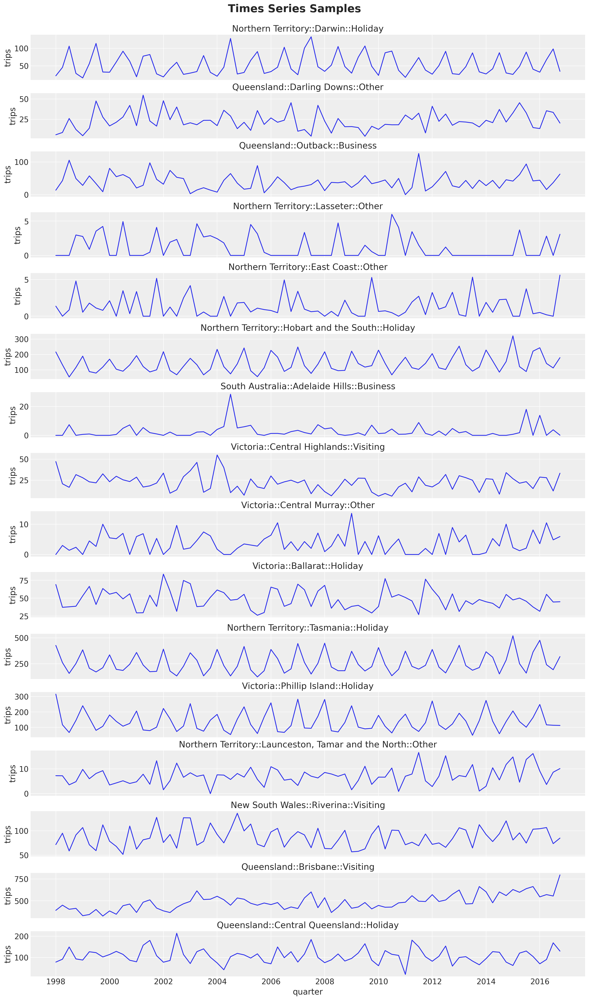

In [8]:
n_series = 16

unique_ids = data_df.select("unique_id").sample(
    n=n_series, with_replacement=False, seed=42
)

fig, axes = plt.subplots(
    nrows=n_series,
    ncols=1,
    figsize=(15, 25),
    sharex=True,
    sharey=False,
    layout="constrained",
)

for i, unique_id in enumerate(unique_ids["unique_id"]):
    ax = axes[i]
    sns.lineplot(
        data=data_df.filter(pl.col("unique_id") == unique_id),
        x="quarter",
        y="trips",
        ax=ax,
    )
    ax.set(title=unique_id)

fig.suptitle("Times Series Samples", fontsize=20, fontweight="bold", y=1.02);

Here are some observations about the time series structure:

- Most of the time series have a yearly seasonality. The pattern is clearer for some of these series than for others.

- The series looks stationary overall (mean and variance do not change over time). We see a mild trend component in some of the series.

## Prepare Data

For this simple example we do a simple train-test split. For real applications it is **strongly** recommended to use a time series cross-validation strategy (see [
Evaluate the model’s performance](https://nixtlaverse.nixtla.io/statsforecast/docs/getting-started/getting_started_complete.html#evaluate-the-models-performance)).

In [9]:
train_test_split_date = datetime(year=2014, month=1, day=1, tzinfo=UTC)

train_data_df = data_df.filter(pl.col("quarter") < pl.lit(train_test_split_date))
test_data_df = data_df.filter(pl.col("quarter") >= pl.lit(train_test_split_date))

n_test = test_data_df["quarter"].n_unique()

assert train_data_df.shape[0] + test_data_df.shape[0] == data_df.shape[0]

In [10]:
pivot_data_train_df = train_data_df.pivot(  # noqa: PD010
    index="quarter", columns="unique_id", values="trips"
)
pivot_data_test_df = test_data_df.pivot(  # noqa: PD010
    index="quarter", columns="unique_id", values="trips"
)

In [11]:
y_train = pivot_data_train_df.drop("quarter").to_jax()
y_test = pivot_data_test_df.drop("quarter").to_jax()

In [12]:
train_unique_ids = pivot_data_train_df.drop("quarter").columns
test_unique_ids = pivot_data_test_df.drop("quarter").columns

train_dates = pivot_data_train_df["quarter"].dt.strftime("%Y-%m-%d").to_numpy()
test_dates = pivot_data_test_df["quarter"].dt.strftime("%Y-%m-%d").to_numpy()

## Statsforecast Model

We start by fitting some univariate models from the Statsforecast package.

In [13]:
n_seasons = 4

models = [
    AutoETS(season_length=n_seasons),
    HoltWinters(season_length=n_seasons),
    SeasonalNaive(season_length=n_seasons),
]

sf = StatsForecast(models=models, freq="1q")

sf_forecast = sf.forecast(
    h=n_test,
    df=train_data_df.select(["unique_id", "quarter", "trips"]),
    time_col="quarter",
    target_col="trips",
    level=[94, 50],
)

Let's look into the point forecasts on the test set:

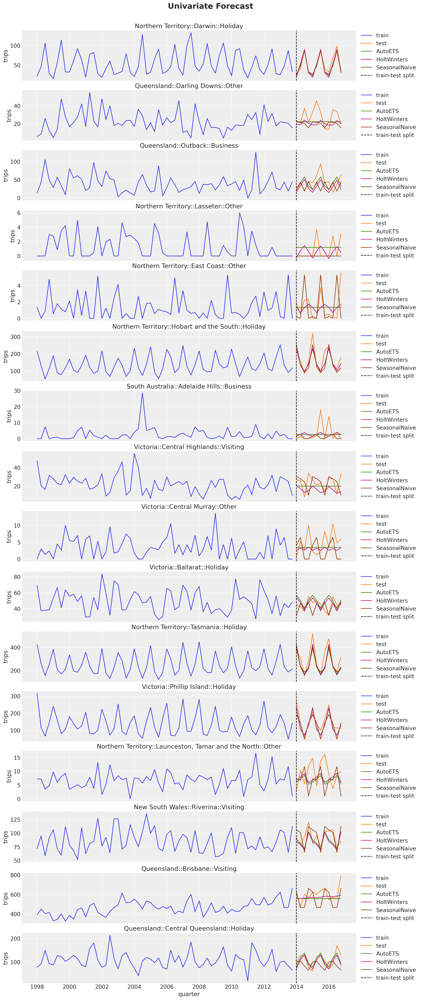

In [14]:
fig, axes = plt.subplots(
    nrows=n_series,
    ncols=1,
    figsize=(15, 35),
    sharex=True,
    sharey=False,
    layout="constrained",
)

for i, unique_id in enumerate(unique_ids["unique_id"]):
    ax = axes[i]
    sns.lineplot(
        x=pivot_data_train_df["quarter"],
        y=pivot_data_train_df[unique_id],
        color="C0",
        label="train",
        ax=ax,
    )
    sns.lineplot(
        x=pivot_data_test_df["quarter"],
        y=pivot_data_test_df[unique_id],
        color="C1",
        label="test",
        ax=ax,
    )

    for j, model_name in enumerate(m.alias for m in models):
        temp_df = sf_forecast.filter(pl.col("unique_id") == pl.lit(unique_id))
        sns.lineplot(
            x=temp_df["quarter"],
            y=temp_df[f"{model_name}"],
            color=f"C{j + 2}",
            label=model_name,
            ax=ax,
        )

    ax.axvline(
        train_test_split_date,
        color="black",
        linestyle="--",
        label="train-test split",
    )

    ax.legend(loc="center left", bbox_to_anchor=(1, 0.5))
    ax.set(title=unique_id, ylabel="trips")

fig.suptitle("Univariate Forecast", fontsize=20, fontweight="bold", y=1.02);

The AutoETS model is very conservative when the signal does not have a clear seasonal pattern. In  many cases it preficts a straight line. The Seasonal Naive model is the most aggressive one, and the Holt-Winters model is in between.

We can now look into the prediction intervals of the Holt-Winters model. We are interested in this model as we will compare it with our hierarchical model version in NumPyro.

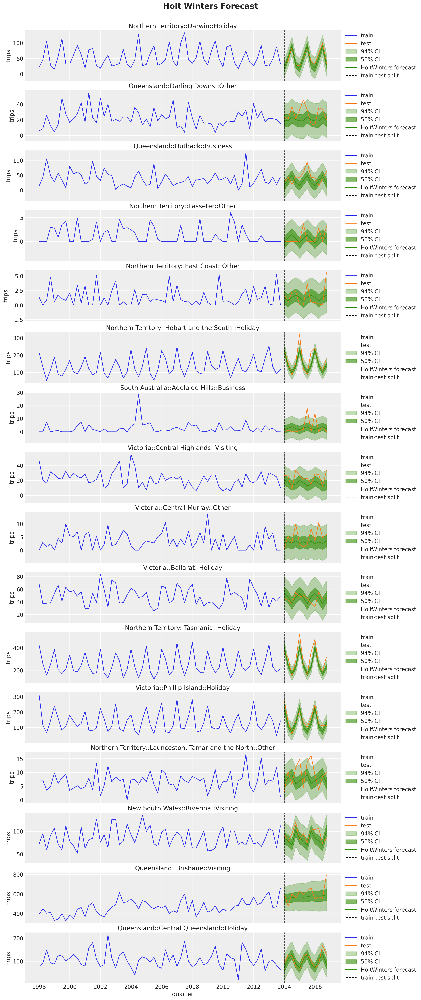

In [15]:
fig, axes = plt.subplots(
    nrows=n_series,
    ncols=1,
    figsize=(15, 35),
    sharex=True,
    sharey=False,
    layout="constrained",
)

for i, unique_id in enumerate(unique_ids["unique_id"]):
    ax = axes[i]
    sns.lineplot(
        x=pivot_data_train_df["quarter"],
        y=pivot_data_train_df[unique_id],
        color="C0",
        label="train",
        ax=ax,
    )
    sns.lineplot(
        x=pivot_data_test_df["quarter"],
        y=pivot_data_test_df[unique_id],
        color="C1",
        label="test",
        ax=ax,
    )

    for j, level in enumerate([94, 50]):
        temp_df = sf_forecast.filter(pl.col("unique_id") == pl.lit(unique_id))
        ax.fill_between(
            temp_df["quarter"],
            temp_df[f"HoltWinters-lo-{level}"],
            temp_df[f"HoltWinters-hi-{level}"],
            alpha=0.3 * (j + 1),
            color="C2",
            label=f"{level}% CI",
        )

    sns.lineplot(
        data=sf_forecast.filter(pl.col("unique_id") == pl.lit(unique_id)),
        x="quarter",
        y="HoltWinters",
        color="C2",
        label="HoltWinters forecast",
        ax=ax,
    )
    ax.axvline(
        train_test_split_date,
        color="black",
        linestyle="--",
        label="train-test split",
    )

    ax.legend(loc="center left", bbox_to_anchor=(1, 0.5))
    ax.set(title=unique_id, ylabel="trips")

fig.suptitle("Holt Winters Forecast", fontsize=20, fontweight="bold", y=1.02);

## NumPyro Model

Now we implement the hierarchical model in NumPyro. In essence, we are extending the univariate model from the blog post ["Notes on Exponential Smoothing with NumPyro"](https://juanitorduz.github.io/exponential_smoothing_numpyro/). On top of the simple extension by vectorization via `plates`. We add a hierarchical component to the noise, trend component and seasonal components. We keep the level components independent. We could build better hierarchies through `states`, but for now we keep it simple.

In [16]:
def model(y: ArrayImpl, n_seasons: int, future: int = 0) -> None:
    t_max, n_series = y.shape

    trend_smoothing_concentration1 = numpyro.sample(
        "trend_smoothing_concentration1",
        dist.Gamma(concentration=4, rate=2),
    )

    trend_smoothing_concentration0 = numpyro.sample(
        "trend_smoothing_concentration0",
        dist.Gamma(concentration=10, rate=2),
    )

    seasonality_smoothing_concentration1 = numpyro.sample(
        "seasonality_smoothing_concentration1",
        dist.Gamma(concentration=4, rate=2),
    )

    seasonality_smoothing_concentration0 = numpyro.sample(
        "seasonality_smoothing_concentration0",
        dist.Gamma(concentration=4, rate=2),
    )

    noise_scale = numpyro.sample("noise_scale", dist.Gamma(concentration=80.0, rate=4))

    with numpyro.plate("series", n_series, dim=-1):
        # Level
        level_smoothing = numpyro.sample(
            "level_smoothing", dist.Beta(concentration1=1, concentration0=1)
        )

        level_init = numpyro.sample("level_init", dist.Normal(loc=0, scale=1))

        # Trend
        trend_smoothing = numpyro.sample(
            "trend_smoothing",
            dist.Beta(
                concentration1=trend_smoothing_concentration1,
                concentration0=trend_smoothing_concentration0,
            ),
        )

        trend_init = numpyro.sample("trend_init", dist.Normal(loc=0, scale=1))

        # Seasonality
        seasonality_smoothing = numpyro.sample(
            "seasonality_smoothing",
            dist.Beta(
                concentration1=seasonality_smoothing_concentration1,
                concentration0=seasonality_smoothing_concentration0,
            ),
        )
        adj_seasonality_smoothing = seasonality_smoothing * (1 - level_smoothing)

        with numpyro.plate("n_seasons", n_seasons, dim=-2):
            seasonality_init = numpyro.sample(
                "seasonality_init", dist.Normal(loc=0, scale=1)
            )

        ## Noise
        noise = numpyro.sample("noise", dist.HalfNormal(scale=noise_scale))

    def transition_fn(carry, t):
        previous_level, previous_trend, previous_seasonality = carry

        level = jnp.where(
            t < t_max,
            level_smoothing * y[t] + (1 - level_smoothing) * previous_level,
            previous_level,
        )

        trend = jnp.where(
            t < t_max,
            trend_smoothing * (level - previous_level)
            + (1 - trend_smoothing) * previous_trend,
            previous_trend,
        )

        new_season = jnp.where(
            t < t_max,
            adj_seasonality_smoothing * (y[t] - (previous_level + previous_trend))
            + (1 - adj_seasonality_smoothing) * previous_seasonality[0],
            previous_seasonality[0],
        )

        step = jnp.where(t < t_max, 1, t - t_max + 1)

        mu = previous_level + step * previous_trend + previous_seasonality[0]

        pred = numpyro.sample("pred", dist.Normal(loc=mu, scale=noise).to_event(1))

        seasonality = jnp.concatenate(
            [previous_seasonality[1:], new_season[None]], axis=0
        )

        return (level, trend, seasonality), pred

    with numpyro.handlers.condition(data={"pred": y}):
        _, preds = scan(
            transition_fn,
            (level_init, trend_init, seasonality_init),
            jnp.arange(t_max + future),
        )

    if future > 0:
        numpyro.deterministic("y_forecast", preds[-future:, ...])

## NUTS Inference

The first inference approach we use is NUTS. We fit the model to the training data and make predictions on the test set. Fitting this model in my local machine (Mac M3) takes around $3$ minutes (not bad for a medium-size data set).

In [17]:
class InferenceParams(BaseModel):
    num_warmup: int = Field(2_500, ge=1)
    num_samples: int = Field(4_000, ge=1)
    num_chains: int = Field(4, ge=1)


def run_inference(
    rng_key: ArrayImpl,
    model: Callable,
    args: InferenceParams,
    *model_args,
    **nuts_kwargs,
) -> MCMC:
    sampler = NUTS(model, **nuts_kwargs)
    mcmc = MCMC(
        sampler=sampler,
        num_warmup=args.num_warmup,
        num_samples=args.num_samples,
        num_chains=args.num_chains,
    )
    mcmc.run(rng_key, *model_args)
    return mcmc

In [18]:
inference_params = InferenceParams()

rng_key, rng_subkey = random.split(key=rng_key)
mcmc = run_inference(
    rng_subkey, model, inference_params, y_train, n_seasons, target_accept_prob=0.80
)

  0%|          | 0/6500 [00:00<?, ?it/s]

  0%|          | 0/6500 [00:00<?, ?it/s]

  0%|          | 0/6500 [00:00<?, ?it/s]

  0%|          | 0/6500 [00:00<?, ?it/s]

We can look into some diagnostics.

In [19]:
idata = az.from_numpyro(
    posterior=mcmc,
    coords={"unique_id": train_unique_ids},
    dims={
        "level_init": ["unique_id"],
        "level_smoothing": ["unique_id"],
        "trend_init": ["unique_id"],
        "trend_smoothing": ["unique_id"],
        "noise": ["unique_id"],
    },
)

print(f"""Divergences: {idata["sample_stats"]["diverging"].sum().item()}""")

Divergences: 0


In [20]:
az.summary(
    data=idata,
    var_names=[
        "trend_smoothing_concentration1",
        "trend_smoothing_concentration0",
        "seasonality_smoothing_concentration1",
        "seasonality_smoothing_concentration0",
        "noise_scale",
    ],
    round_to=2,
)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
trend_smoothing_concentration1,0.13,0.05,0.06,0.21,0.00,0.00,174.05,403.45,1.01
trend_smoothing_concentration0,7.42,1.90,3.94,10.93,0.05,0.04,1326.70,5152.88,1.00
seasonality_smoothing_concentration1,0.40,0.07,0.28,0.52,0.00,0.00,1205.39,2621.63,1.00
seasonality_smoothing_concentration0,2.53,0.44,1.75,3.36,0.01,0.01,1688.03,4042.22,1.00
noise_scale,29.12,1.06,27.10,31.09,0.01,0.00,30662.50,12107.40,1.00


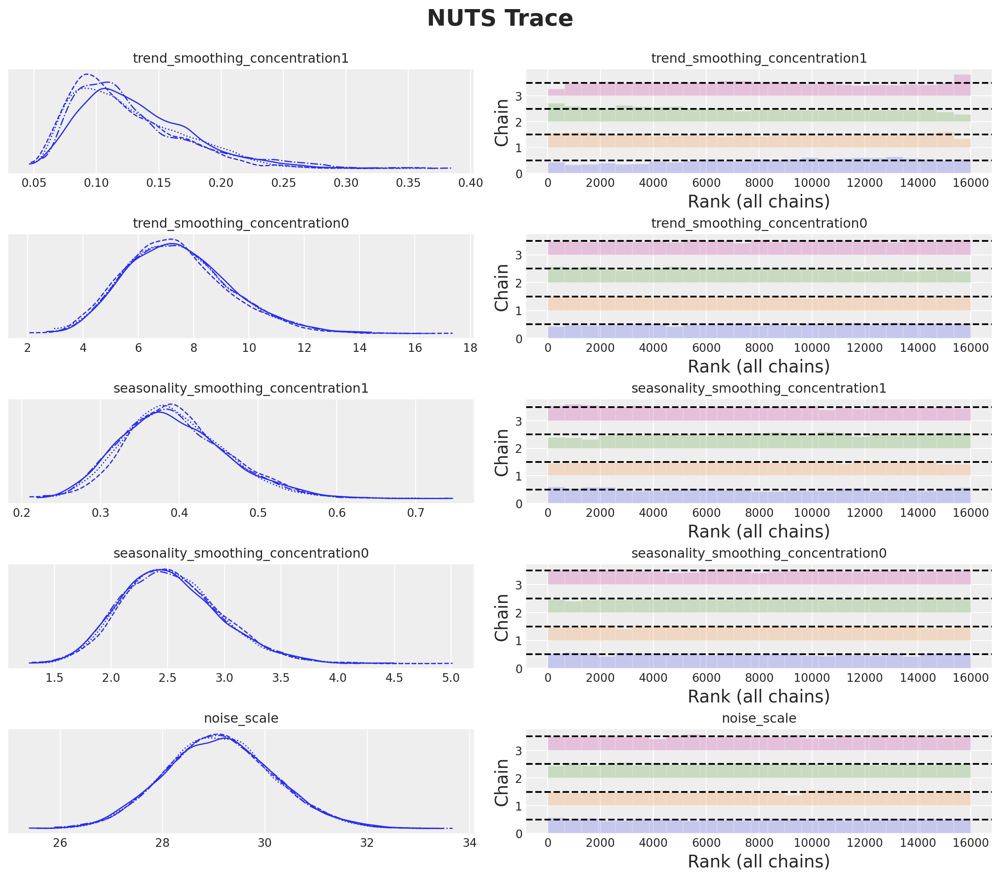

In [21]:
axes = az.plot_trace(
    data=idata,
    var_names=[
        "trend_smoothing_concentration1",
        "trend_smoothing_concentration0",
        "seasonality_smoothing_concentration1",
        "seasonality_smoothing_concentration0",
        "noise_scale",
    ],
    compact=True,
    kind="rank_bars",
    backend_kwargs={"figsize": (12, 10), "layout": "constrained"},
)
plt.gcf().suptitle("NUTS Trace", fontsize=20, fontweight="bold", y=1.05);

Overall, the model seems to have converged. Let's generate the sample forecasts.

In [22]:
def forecast(
    rng_key: ArrayImpl, model: Callable, samples: dict[str, ArrayImpl], *model_args
) -> dict[str, ArrayImpl]:
    predictive = Predictive(
        model=model,
        posterior_samples=samples,
        return_sites=["y_forecast"],
    )
    return predictive(rng_key, *model_args)

In [23]:
rng_key, rng_subkey = random.split(key=rng_key)
forecast = forecast(rng_subkey, model, mcmc.get_samples(), y_train, n_seasons, n_test)

In [24]:
idata.extend(
    az.from_numpyro(
        posterior_predictive=forecast,
        coords={"unique_id": train_unique_ids, "date": test_dates},
        dims={"y_forecast": ["date", "unique_id"]},
    )
)

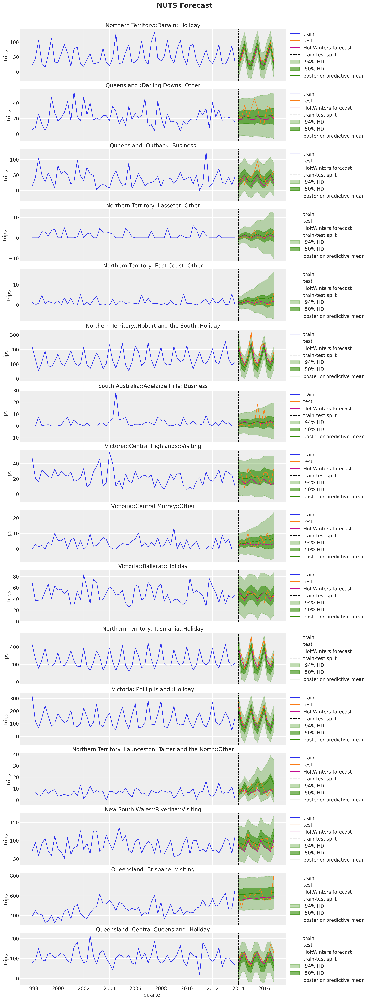

In [25]:
fig, axes = plt.subplots(
    nrows=n_series,
    ncols=1,
    figsize=(15, 40),
    sharex=True,
    sharey=False,
    layout="constrained",
)

for i, unique_id in enumerate(unique_ids["unique_id"]):
    ax = axes[i]
    sns.lineplot(
        x=pivot_data_train_df["quarter"],
        y=pivot_data_train_df[unique_id],
        color="C0",
        label="train",
        ax=ax,
    )
    sns.lineplot(
        x=pivot_data_test_df["quarter"],
        y=pivot_data_test_df[unique_id],
        color="C1",
        label="test",
        ax=ax,
    )
    sns.lineplot(
        data=sf_forecast.filter(pl.col("unique_id") == pl.lit(unique_id)),
        x="quarter",
        y="HoltWinters",
        color="C3",
        label="HoltWinters forecast",
        ax=ax,
    )
    ax.axvline(
        train_test_split_date,
        color="black",
        linestyle="--",
        label="train-test split",
    )

    for j, hdi in enumerate([0.94, 0.5]):
        az.plot_hdi(
            x=pivot_data_test_df["quarter"],
            y=idata.posterior_predictive["y_forecast"].sel(unique_id=unique_id),
            hdi_prob=hdi,
            smooth=False,
            color="C2",
            fill_kwargs={"alpha": 0.3 * (j + 1), "label": f"{hdi: .0%} HDI"},
            ax=ax,
        )

    sns.lineplot(
        x=pivot_data_test_df["quarter"],
        y=idata.posterior_predictive["y_forecast"]
        .sel(unique_id=unique_id)
        .mean(dim=("chain", "draw")),
        color="C2",
        label="posterior predictive mean",
        ax=ax,
    )

    ax.legend(loc="center left", bbox_to_anchor=(1, 0.5))
    ax.set(title=unique_id, ylabel="trips")

fig.suptitle("NUTS Forecast", fontsize=20, fontweight="bold", y=1.02);

The results look very reasonable! A result of the hierarchical structure is that the hierarchical model is campturing trend components on time series that are flat in the fistorical data. See for example:

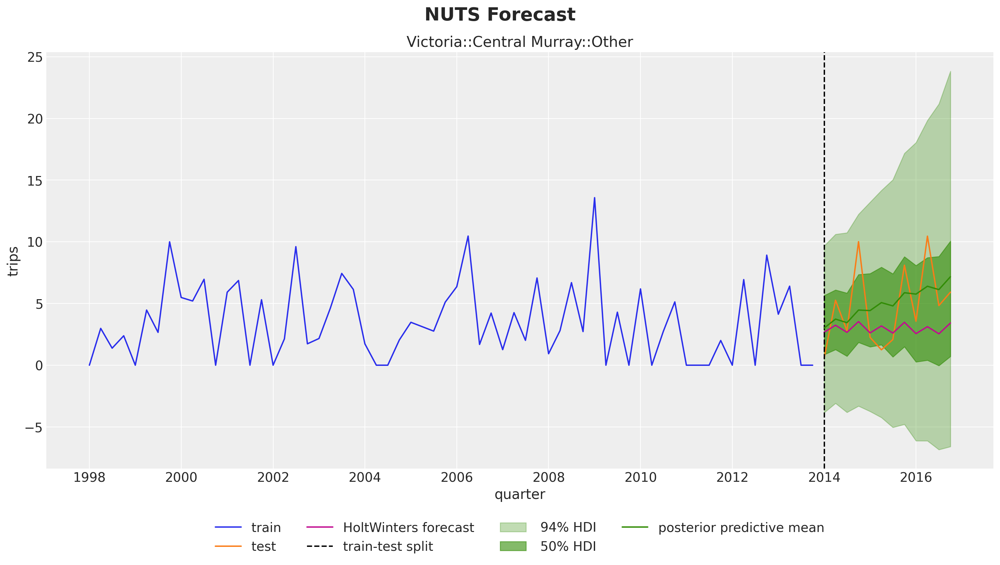

In [26]:
fig, ax = plt.subplots(figsize=(15, 8))


unique_id = "Victoria::Central Murray::Other"

sns.lineplot(
    x=pivot_data_train_df["quarter"],
    y=pivot_data_train_df[unique_id],
    color="C0",
    label="train",
    ax=ax,
)
sns.lineplot(
    x=pivot_data_test_df["quarter"],
    y=pivot_data_test_df[unique_id],
    color="C1",
    label="test",
    ax=ax,
)
sns.lineplot(
    data=sf_forecast.filter(pl.col("unique_id") == pl.lit(unique_id)),
    x="quarter",
    y="HoltWinters",
    color="C3",
    label="HoltWinters forecast",
    ax=ax,
)
ax.axvline(
    train_test_split_date,
    color="black",
    linestyle="--",
    label="train-test split",
)

for j, hdi in enumerate([0.94, 0.5]):
    az.plot_hdi(
        x=pivot_data_test_df["quarter"],
        y=idata.posterior_predictive["y_forecast"].sel(unique_id=unique_id),
        hdi_prob=hdi,
        smooth=False,
        color="C2",
        fill_kwargs={"alpha": 0.3 * (j + 1), "label": f"{hdi: .0%} HDI"},
        ax=ax,
    )

sns.lineplot(
    x=pivot_data_test_df["quarter"],
    y=idata.posterior_predictive["y_forecast"]
    .sel(unique_id=unique_id)
    .mean(dim=("chain", "draw")),
    color="C2",
    label="posterior predictive mean",
    ax=ax,
)

ax.legend(loc="upper center", bbox_to_anchor=(0.5, -0.1), ncol=4)
ax.set(title=unique_id, ylabel="trips")

fig.suptitle("NUTS Forecast", fontsize=20, fontweight="bold", y=1.05);

We will do a more formal evaluation of the model using the CRPS metric at the end of this blog post.

## Stochastic Variational Inference (SVI)

Next, we use SVI to fit the model. We use an [`AutoDiagonalNormal`](https://docs.pyro.ai/en/stable/infer.autoguide.html#autodiagonalnormal) guide to keep the inference simple. The fitting time is much faster than NUTS (around $15$ seconds in my local machine). For an introduction to SVI for time series model see the blog posts ["Exploring TensorFlow Probability STS Forecasting"](https://juanitorduz.github.io/intro_sts_tfp/) and ["Finally! Bayesian Hierarchical Modelling at Scale"](https://florianwilhelm.info/2020/10/bayesian_hierarchical_modelling_at_scale/).

100%|██████████| 15000/15000 [00:12<00:00, 1218.70it/s, init loss: 65847288.0000, avg. loss [14251-15000]: 80034.1612]


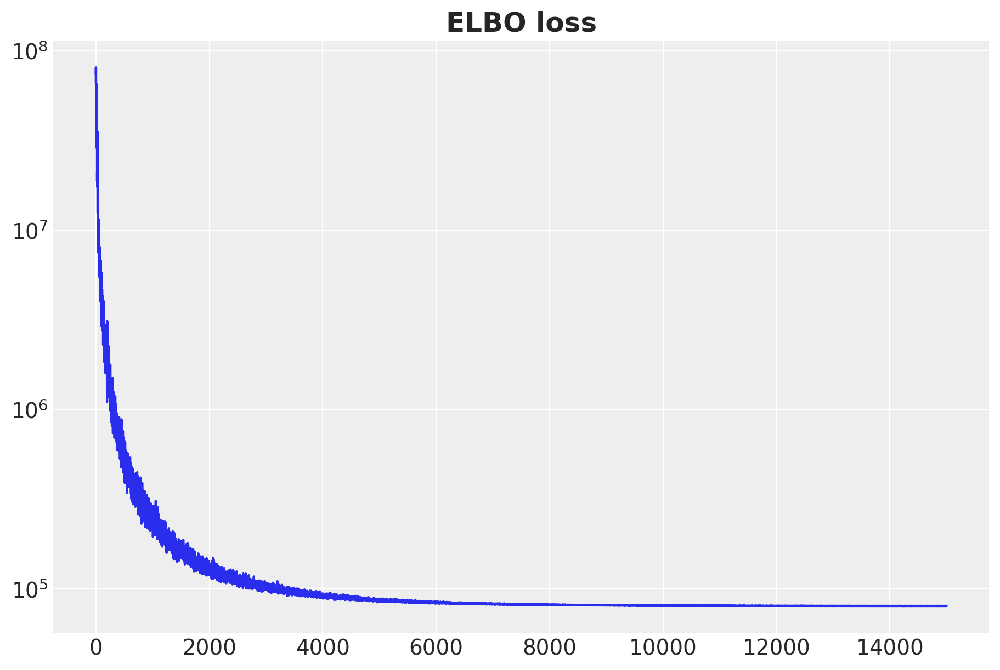

In [27]:
guide = AutoDiagonalNormal(model=model, init_loc_fn=init_to_sample)
optimizer = numpyro.optim.Adam(step_size=0.03)
svi = SVI(model, guide, optimizer, loss=Trace_ELBO())
num_steps = 15_000
rng_key, rng_subkey = random.split(key=rng_key)
svi_result = svi.run(
    rng_subkey,
    num_steps,
    y_train,
    n_seasons,
)

fig, ax = plt.subplots(figsize=(9, 6))
ax.plot(svi_result.losses)
ax.set(yscale="log")
ax.set_title("ELBO loss", fontsize=18, fontweight="bold");

The ELBO seems to have converged. Let's generate the sample forecasts.

In [28]:
rng_key, rng_subkey = random.split(rng_key)
svi_posterior_predictive = Predictive(
    model=model,
    guide=guide,
    params=svi_result.params,
    num_samples=inference_params.num_samples * inference_params.num_chains,
)(rng_subkey, y_train, n_seasons, n_test)

In [29]:
svi_idata = az.from_dict(
    posterior_predictive={
        k: jnp.expand_dims(a=jnp.asarray(v), axis=0)
        for k, v in svi_posterior_predictive.items()
    },
    coords={
        "unique_id": train_unique_ids,
        "date_test": test_dates,
        "date": [*train_dates, *test_dates],
    },
    dims={"y_forecast": ["date_test", "unique_id"], "pred": ["date", "unique_id"]},
)

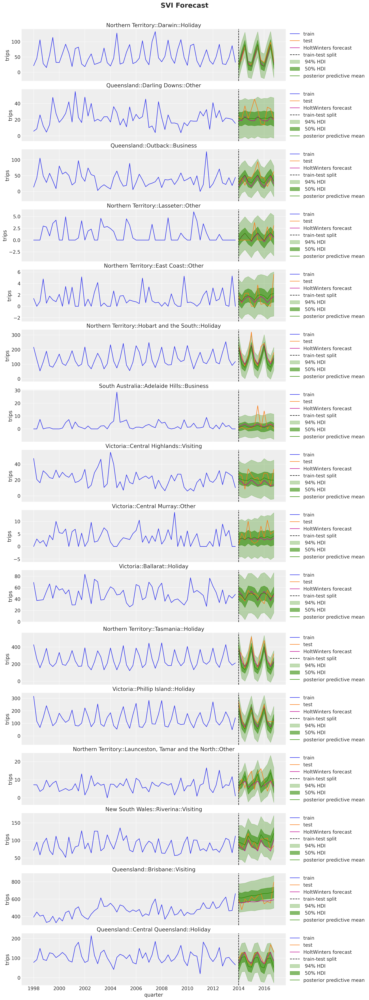

In [30]:
fig, axes = plt.subplots(
    nrows=n_series,
    ncols=1,
    figsize=(15, 40),
    sharex=True,
    sharey=False,
    layout="constrained",
)

for i, unique_id in enumerate(unique_ids["unique_id"]):
    ax = axes[i]
    sns.lineplot(
        x=pivot_data_train_df["quarter"],
        y=pivot_data_train_df[unique_id],
        color="C0",
        label="train",
        ax=ax,
    )
    sns.lineplot(
        x=pivot_data_test_df["quarter"],
        y=pivot_data_test_df[unique_id],
        color="C1",
        label="test",
        ax=ax,
    )
    sns.lineplot(
        data=sf_forecast.filter(pl.col("unique_id") == pl.lit(unique_id)),
        x="quarter",
        y="HoltWinters",
        color="C3",
        label="HoltWinters forecast",
        ax=ax,
    )
    ax.axvline(
        train_test_split_date,
        color="black",
        linestyle="--",
        label="train-test split",
    )

    for j, hdi in enumerate([0.94, 0.5]):
        az.plot_hdi(
            x=pivot_data_test_df["quarter"],
            y=svi_idata.posterior_predictive["y_forecast"].sel(unique_id=unique_id),
            hdi_prob=hdi,
            smooth=False,
            color="C2",
            fill_kwargs={"alpha": 0.3 * (j + 1), "label": f"{hdi: .0%} HDI"},
            ax=ax,
        )

    sns.lineplot(
        x=pivot_data_test_df["quarter"],
        y=svi_idata.posterior_predictive["y_forecast"]
        .sel(unique_id=unique_id)
        .mean(dim=("chain", "draw")),
        color="C2",
        label="posterior predictive mean",
        ax=ax,
    )

    ax.legend(loc="center left", bbox_to_anchor=(1, 0.5))
    ax.set(title=unique_id, ylabel="trips")

fig.suptitle("SVI Forecast", fontsize=20, fontweight="bold", y=1.02);

The results also look reasonable! Nevertheless, eventhough the model is the same, we do get some differences. We can clearly see this in the example above:

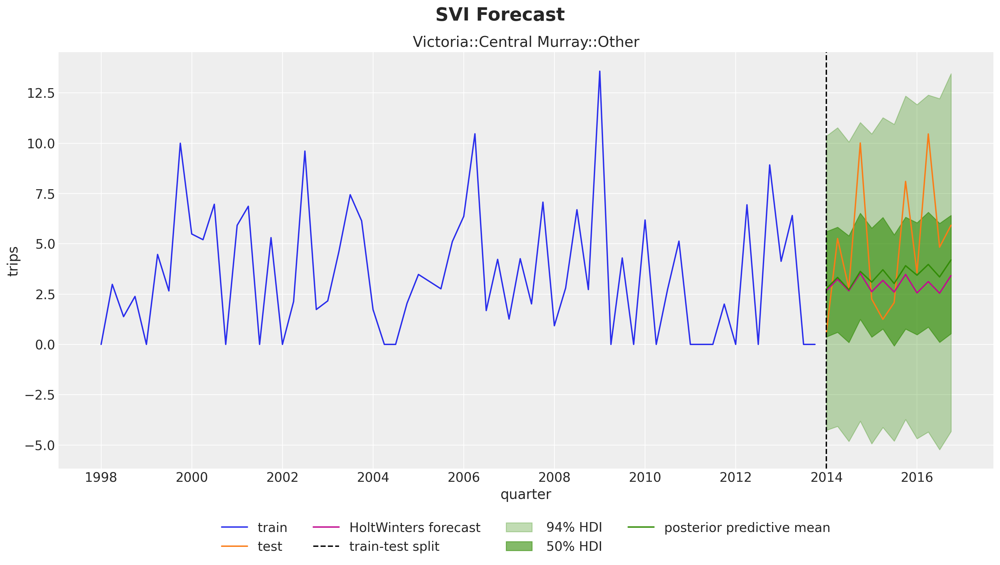

In [31]:
fig, ax = plt.subplots(figsize=(15, 8))


unique_id = "Victoria::Central Murray::Other"

sns.lineplot(
    x=pivot_data_train_df["quarter"],
    y=pivot_data_train_df[unique_id],
    color="C0",
    label="train",
    ax=ax,
)
sns.lineplot(
    x=pivot_data_test_df["quarter"],
    y=pivot_data_test_df[unique_id],
    color="C1",
    label="test",
    ax=ax,
)
sns.lineplot(
    data=sf_forecast.filter(pl.col("unique_id") == pl.lit(unique_id)),
    x="quarter",
    y="HoltWinters",
    color="C3",
    label="HoltWinters forecast",
    ax=ax,
)
ax.axvline(
    train_test_split_date,
    color="black",
    linestyle="--",
    label="train-test split",
)

for j, hdi in enumerate([0.94, 0.5]):
    az.plot_hdi(
        x=pivot_data_test_df["quarter"],
        y=svi_idata.posterior_predictive["y_forecast"].sel(unique_id=unique_id),
        hdi_prob=hdi,
        smooth=False,
        color="C2",
        fill_kwargs={"alpha": 0.3 * (j + 1), "label": f"{hdi: .0%} HDI"},
        ax=ax,
    )

sns.lineplot(
    x=pivot_data_test_df["quarter"],
    y=svi_idata.posterior_predictive["y_forecast"]
    .sel(unique_id=unique_id)
    .mean(dim=("chain", "draw")),
    color="C2",
    label="posterior predictive mean",
    ax=ax,
)

ax.legend(loc="upper center", bbox_to_anchor=(0.5, -0.1), ncol=4)
ax.set(title=unique_id, ylabel="trips")

fig.suptitle("SVI Forecast", fontsize=20, fontweight="bold", y=1.05);

The inferrend trend component is milder in the SVI case for this specific time series.

## Evaluation

In this final section we do a model comparison based on this simple train-test split. We use the [CRPS metric](https://towardsdatascience.com/crps-a-scoring-function-for-bayesian-machine-learning-models-dd55a7a337a8) to compare the models.

>"The CRPS — Continuous Ranked Probability Score — is a score function that compares a single ground truth value to a Cumulative Distribution Function. It t can be used as a metric to evaluate a model’s performance when the target variable is continuous and the model predicts the target’s distribution; Examples include Bayesian Regression or Bayesian Time Series models."

We borrow an implementation of the CRPS metric from [`pyro.ops.stats.crps_empirical`](https://docs.pyro.ai/en/dev/_modules/pyro/ops/stats.html) and simply translate it to JAX.

In [32]:
def crps(truth, pred, sample_weight=None):
    if pred.shape[1:] != (1,) * (pred.ndim - truth.ndim - 1) + truth.shape:
        raise ValueError(
            f"""Expected pred to have one extra sample dim on left.
            Actual shapes: {pred.shape} versus {truth.shape}"""
        )
    num_samples = pred.shape[0]
    if num_samples == 1:
        return jnp.abs(pred[0] - truth)

    pred = jnp.sort(pred, axis=0)
    diff = pred[1:] - pred[:-1]
    weight = jnp.arange(1, num_samples) * jnp.arange(num_samples - 1, 0, -1)
    weight = weight.reshape(weight.shape + (1,) * (diff.ndim - 1))

    absolute_error = jnp.mean(jnp.abs(pred - truth), axis=0)

    per_obs_crps = absolute_error - jnp.sum(diff * weight, axis=0) / num_samples**2
    return jnp.average(per_obs_crps, weights=sample_weight)

Let's compute the CRPS for the NUTS and SVI models.

In [33]:
y_pred_nuts = jnp.array(
    az.extract(
        data=idata, group="posterior_predictive", var_names=["y_forecast"]
    ).transpose("sample", ...)
)

y_pred_svi = jnp.array(
    az.extract(
        data=svi_idata, group="posterior_predictive", var_names=["y_forecast"]
    ).transpose("sample", ...)
)

In [34]:
crps(truth=y_test, pred=y_pred_nuts)

Array(11.743771, dtype=float32)

In [35]:
crps(truth=y_test, pred=y_pred_svi)

Array(11.760125, dtype=float32)

The results are very similar!

One important aspect of the CRPS metric is that it reduces to the Mean Absolute Error (MAE) for point forecasts. Let's to this for all of the models.

In [36]:
y_pred_autoets = (
    sf_forecast.pivot(index="quarter", columns="unique_id", values="AutoETS")  # noqa: PD010
    .select(train_unique_ids)
    .to_jax()[None, ...]
)

y_pred_hw = (
    sf_forecast.pivot(index="quarter", columns="unique_id", values="HoltWinters")  # noqa: PD010
    .select(train_unique_ids)
    .to_jax()[None, ...]
)

y_pred_seasonal = (
    sf_forecast.pivot(index="quarter", columns="unique_id", values="SeasonalNaive")  # noqa: PD010
    .select(train_unique_ids)
    .to_jax()[None, ...]
)

y_pred_nuts_mean = jnp.array(
    idata.posterior_predictive["y_forecast"].mean(dim=("chain", "draw"))
)[None, ...]

y_pred_svi_mean = jnp.array(
    svi_idata.posterior_predictive["y_forecast"].mean(dim=("chain", "draw"))
)[None, ...]

In [37]:
crps_df = pl.DataFrame(
    {
        "AutoETS": crps(truth=y_test, pred=y_pred_autoets).mean(),
        "HoltWinters": crps(truth=y_test, pred=y_pred_hw).mean(),
        "SeasonalNaive": crps(truth=y_test, pred=y_pred_seasonal).mean(),
        "NUTS-Mean": crps(truth=y_test, pred=y_pred_nuts_mean).mean(),
        "SVI-Mean": crps(truth=y_test, pred=y_pred_svi_mean).mean(),
        "NUTS": crps(truth=y_test, pred=y_pred_nuts).mean(),
        "SVI": crps(truth=y_test, pred=y_pred_svi).mean(),
    }
)

melt_crps_df = (
    crps_df.melt(value_vars=crps_df.columns, variable_name="model", value_name="crps")
    .with_columns(
        point_estimate=pl.when(pl.col("model") == pl.lit("NUTS"))
        .then(0)
        .when(pl.col("model") == pl.lit("SVI"))
        .then(0)
        .otherwise(1)
    )
    .sort("model")
)

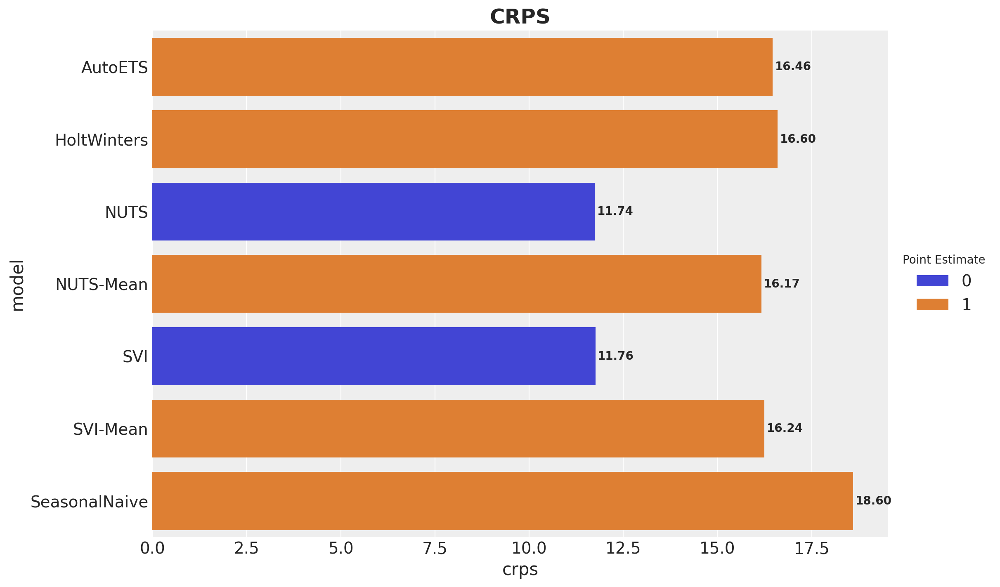

In [38]:
fig, ax = plt.subplots()

sns.barplot(
    data=melt_crps_df,
    x="crps",
    y="model",
    hue="point_estimate",
    ax=ax,
)


for container in ax.containers:
    ax.bar_label(
        container,
        fmt="%.2f",
        label_type="edge",
        padding=2,
        fontsize=10,
        fontweight="bold",
    )

ax.legend(title="Point Estimate", loc="center left", bbox_to_anchor=(1, 0.5))
ax.set_title("CRPS", fontsize=18, fontweight="bold");

Here are some takeaways from this plot: 

- For the point forecasts, the NUTS model is the best by a little small margin. To have a better performance comparison, we should use a time series cross-validation strategy (homework for the reader 🤓).
- The NUTS and SVI models performance is very similar. In real large scale applications SVI is a great alternative to NUTS (one still has to fo the prior sensitivity analysis, there is no free lunch!).
- Statistical univariate models are hard to beat! AutoETS is the best model in this case.

Finally, lets look at this results in the context of the absolute error distribution:

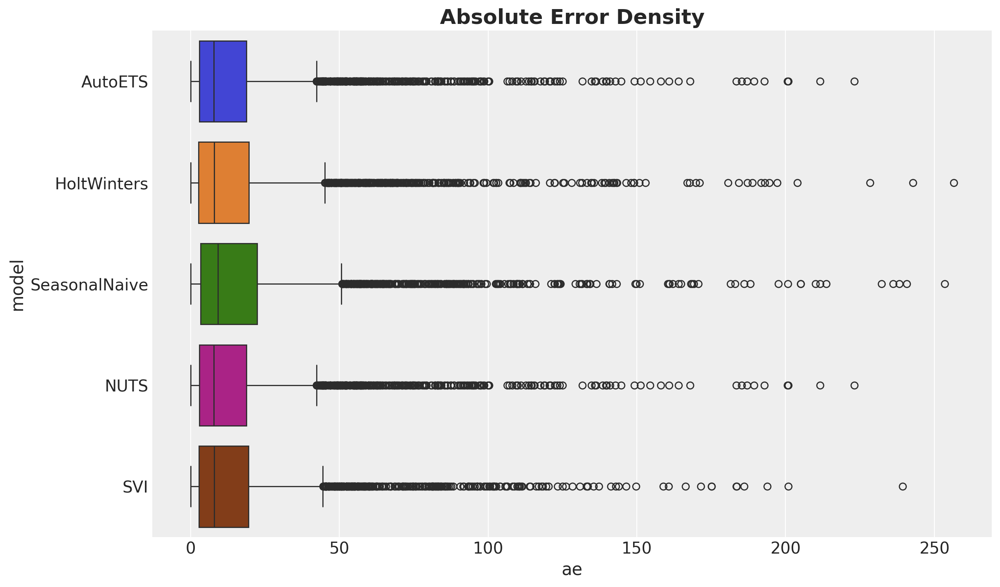

In [39]:
ae_df = pl.DataFrame(
    {
        "AutoETS": np.array(crps(truth=y_test, pred=y_pred_nuts_mean).flatten()),
        "HoltWinters": np.array(crps(truth=y_test, pred=y_pred_hw).flatten()),
        "SeasonalNaive": np.array(crps(truth=y_test, pred=y_pred_seasonal).flatten()),
        "NUTS": np.array(crps(truth=y_test, pred=y_pred_nuts_mean).flatten()),
        "SVI": np.array(crps(truth=y_test, pred=y_pred_svi_mean).flatten()),
    }
)
melt_ae_df = ae_df.melt(
    value_vars=ae_df.columns, variable_name="model", value_name="ae"
)

fig, ax = plt.subplots()
sns.boxplot(
    data=melt_ae_df,
    x="ae",
    y="model",
    hue="model",
    ax=ax,
)
ax.set_title("Absolute Error Density", fontsize=18, fontweight="bold");